# Penyusunan Dataset Final YOLOv8 ALPR Lampung

Notebook ini merupakan tahap lanjutan setelah label polygon/mask Roboflow dikonversi menjadi bounding box YOLO detection. Tujuan utama notebook ini adalah membersihkan nama file hasil export Roboflow, mencocokkan file gambar dengan `ground_truth.csv`, membuat split `train/valid/test` yang lebih terkontrol, lalu menyusun dataset final untuk training YOLOv8 object detection.

Project **ALPR Lampung License Plate Detection** menggunakan YOLOv8 untuk mendeteksi lokasi plat nomor kendaraan, kemudian PaddleOCR untuk membaca teks plat dari hasil crop. Walaupun YOLOv8 hanya dilatih untuk mendeteksi kelas `license_plate`, split dataset tetap mempertimbangkan `kode_wilayah_gt`, `wilayah_gt`, dan duplikasi `plat_gt` agar evaluasi OCR dan wilayah setelah deteksi tidak terlalu bias.

Notebook ini tidak melakukan training YOLO dan tidak mengubah dataset input. Semua output akan disimpan ke folder baru `ALPR-Lampung-final`.

## 1. Mount Google Drive

Cell ini menghubungkan Google Colab dengan Google Drive. Pastikan folder `ALPR-Lampung-bbox` dan file `ground_truth.csv` sudah tersedia di `MyDrive`, atau sesuaikan path pada bagian konfigurasi.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Konfigurasi Path dan Parameter

Dataset input adalah hasil notebook sebelumnya, yaitu folder `ALPR-Lampung-bbox`. File `ground_truth.csv` digunakan sebagai acuan nama file bersih, teks plat, dan metadata wilayah. Dataset final akan dibuat pada folder baru `ALPR-Lampung-final`.

Secara default `OVERWRITE_OUTPUT=False`, sehingga notebook tidak akan menghapus folder output yang sudah ada. Jika Anda ingin menjalankan ulang dari awal, ubah `OVERWRITE_OUTPUT=True` secara sadar.

In [ ]:
from pathlib import Path
import math
import random
import re
import shutil
import subprocess
import sys
from collections import Counter, defaultdict

try:
    import yaml
except ModuleNotFoundError:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'pyyaml'])
    import yaml

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image

INPUT_DATASET_ROOT = "/content/drive/MyDrive/ALPR-Lampung-bbox"
GROUND_TRUTH_PATH = "/content/drive/MyDrive/ground_truth.csv"
OUTPUT_DATASET_ROOT = "/content/drive/MyDrive/ALPR-Lampung-final"

OVERWRITE_OUTPUT = False
RANDOM_SEED = 42
TARGET_SPLIT_RATIO = {'train': 0.70, 'valid': 0.20, 'test': 0.10}

IMAGE_EXTS = {'.jpg', '.jpeg', '.png'}
CLASS_NAMES = ['license_plate']
EXPECTED_CLASS_ID = 0
BASE_ID_PATTERN = re.compile(r'(alpr_lampung_\d{6})')
SPLITS = ['train', 'valid', 'test']
N_VISUALIZE = 24  # tampilkan 15 sampai 30 gambar jika tersedia

INPUT_ROOT = Path(INPUT_DATASET_ROOT)
GROUND_TRUTH_FILE = Path(GROUND_TRUTH_PATH)
OUTPUT_ROOT = Path(OUTPUT_DATASET_ROOT)

random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print('Input dataset bbox:', INPUT_ROOT)
print('Ground truth CSV  :', GROUND_TRUTH_FILE)
print('Output final      :', OUTPUT_ROOT)

Input dataset bbox: /content/drive/MyDrive/ALPR-Lampung-bbox
Ground truth CSV  : /content/drive/MyDrive/ground_truth.csv
Output final      : /content/drive/MyDrive/ALPR-Lampung-final


## 3. Pemeriksaan Keberadaan Input

Sebelum memproses dataset, notebook memeriksa apakah folder input, folder image, folder label, dan file ground truth tersedia. Pemeriksaan ini mencegah proses lanjut berjalan dengan path yang salah.

In [ ]:
required_paths = {
    'INPUT_DATASET_ROOT': INPUT_ROOT,
    'train/images': INPUT_ROOT / 'train' / 'images',
    'train/labels': INPUT_ROOT / 'train' / 'labels',
    'GROUND_TRUTH_PATH': GROUND_TRUTH_FILE,
}

for name, path in required_paths.items():
    if not path.exists():
        raise FileNotFoundError(f'{name} tidak ditemukan: {path}')

if OUTPUT_ROOT.resolve() == INPUT_ROOT.resolve():
    raise ValueError('OUTPUT_DATASET_ROOT tidak boleh sama dengan INPUT_DATASET_ROOT.')

print('Semua input utama ditemukan.')
print('Isi folder input root:')
for item in sorted(INPUT_ROOT.iterdir()):
    print('-', item.name)

Semua input utama ditemukan.
Isi folder input root:
- conversion_report.csv
- data.yaml
- train


## 4. Load dan Normalisasi `ground_truth.csv`

Ground truth minimal harus memiliki kolom `filename`, `plat_gt`, `kode_wilayah_gt`, dan `wilayah_gt`. Jika ada kolom tambahan seperti kualitas atau catatan, kolom tersebut tetap dipertahankan.

Normalisasi filename dilakukan dengan aturan: spasi dihapus, `base_id` diekstrak menggunakan pola `alpr_lampung_XXXXXX`, dan ekstensi dipastikan menjadi `.jpg`. Dengan demikian `ground_truth.csv` menjadi referensi nama bersih untuk dataset final.

In [ ]:
def extract_base_id(value):
    if pd.isna(value):
        return None
    match = BASE_ID_PATTERN.search(str(value).strip())
    return match.group(1) if match else None


def normalize_ground_truth_filename(value):
    base_id = extract_base_id(value)
    if base_id is None:
        return None
    return f'{base_id}.jpg'


gt_df = pd.read_csv(GROUND_TRUTH_FILE)
gt_df.columns = [str(c).strip() for c in gt_df.columns]

required_gt_columns = ['filename', 'plat_gt', 'kode_wilayah_gt', 'wilayah_gt']
missing_columns = [c for c in required_gt_columns if c not in gt_df.columns]
if missing_columns:
    raise ValueError(f'Kolom wajib tidak ditemukan pada ground_truth.csv: {missing_columns}')

gt_df = gt_df.copy()
gt_df['filename_original'] = gt_df['filename'].astype(str).str.strip()
gt_df['base_id'] = gt_df['filename_original'].apply(extract_base_id)
gt_df['filename'] = gt_df['filename_original'].apply(normalize_ground_truth_filename)
gt_df['plat_gt'] = gt_df['plat_gt'].astype(str).str.strip()
gt_df['kode_wilayah_gt'] = gt_df['kode_wilayah_gt'].astype(str).str.strip()
gt_df['wilayah_gt'] = gt_df['wilayah_gt'].astype(str).str.strip()

invalid_gt_filename_df = gt_df[gt_df['filename'].isna()].copy()
if len(invalid_gt_filename_df) > 0:
    print('Warning: ditemukan filename ground truth yang tidak cocok dengan pola alpr_lampung_XXXXXX.')
    display(invalid_gt_filename_df[['filename_original']].head(20))

gt_df = gt_df[gt_df['filename'].notna()].copy()

duplicate_gt_filenames = gt_df[gt_df.duplicated('filename', keep=False)].sort_values('filename')
if len(duplicate_gt_filenames) > 0:
    print('Warning: ditemukan duplikasi filename pada ground_truth.csv. Periksa tabel berikut.')
    display(duplicate_gt_filenames[['filename', 'plat_gt', 'kode_wilayah_gt', 'wilayah_gt']].head(30))

print('Jumlah baris ground truth valid:', len(gt_df))
display(gt_df.head())

Jumlah baris ground truth valid: 185


,filename,plat_gt,kode_wilayah_gt,wilayah_gt,filename_original,base_id
0,alpr_lampung_000001.jpg,BE 1943 FL,F,Kota Metro,alpr_lampung_000001.jpg,alpr_lampung_000001
1,alpr_lampung_000002.jpg,BE 8264 FT,F,Kota Metro,alpr_lampung_000002.jpg,alpr_lampung_000002
2,alpr_lampung_000003.jpg,BE 1237 FR,F,Kota Metro,alpr_lampung_000003.jpg,alpr_lampung_000003
3,alpr_lampung_000004.jpg,BE 1340 FG,F,Kota Metro,alpr_lampung_000004.jpg,alpr_lampung_000004
4,alpr_lampung_000005.jpg,BE 1687 GP,G,Kabupaten Lampung Tengah,alpr_lampung_000005.jpg,alpr_lampung_000005


## 5. Scan File Dataset Roboflow BBox

Cell ini membaca semua gambar dari `ALPR-Lampung-bbox/train/images` dan semua label dari `ALPR-Lampung-bbox/train/labels`. Ekstensi gambar yang didukung adalah `.jpg`, `.jpeg`, dan `.png`.

Pada tahap ini belum ada file yang disalin. Notebook hanya membuat daftar file dan pasangan berdasarkan nama stem Roboflow.

In [ ]:
def list_files_by_ext(directory: Path, extensions):
    if not directory.exists():
        return []
    return sorted([p for p in directory.iterdir() if p.is_file() and p.suffix.lower() in extensions])


def list_label_files(directory: Path):
    if not directory.exists():
        return []
    return sorted([p for p in directory.iterdir() if p.is_file() and p.suffix.lower() == '.txt'])


def build_stem_map(paths):
    stem_map = {}
    duplicates = []
    for path in paths:
        if path.stem in stem_map:
            duplicates.append(path.stem)
        stem_map[path.stem] = path
    return stem_map, duplicates


input_image_dir = INPUT_ROOT / 'train' / 'images'
input_label_dir = INPUT_ROOT / 'train' / 'labels'
input_images = list_files_by_ext(input_image_dir, IMAGE_EXTS)
input_labels = list_label_files(input_label_dir)
image_map, duplicate_image_stems = build_stem_map(input_images)
label_map, duplicate_label_stems = build_stem_map(input_labels)

print('Jumlah image Roboflow bbox:', len(input_images))
print('Jumlah label Roboflow bbox:', len(input_labels))
print('Duplikasi stem image:', len(duplicate_image_stems))
print('Duplikasi stem label:', len(duplicate_label_stems))

Jumlah image Roboflow bbox: 185
Jumlah label Roboflow bbox: 185
Duplikasi stem image: 0
Duplikasi stem label: 0


## 6. Ekstraksi `base_id` dan Pembuatan Mapping Filename

Nama file Roboflow biasanya memiliki suffix tambahan seperti:

```text
alpr_lampung_000164_jpg.rf.iEuIsrINAgc2Myj6NLq.jpg
```

Notebook mengekstrak bagian penting menggunakan regex:

```python
r"(alpr_lampung_\d{6})"
```

Dari `base_id` tersebut dibuat nama bersih `alpr_lampung_000164.jpg` dan label bersih `alpr_lampung_000164.txt`. Nama bersih ini digunakan untuk mencocokkan dataset dengan `ground_truth.csv`.

In [ ]:
gt_filename_set = set(gt_df['filename'])
gt_by_filename = gt_df.set_index('filename', drop=False)

mapping_rows = []

for image_path in input_images:
    base_id = extract_base_id(image_path.name)
    roboflow_label_path = label_map.get(image_path.stem)
    clean_image_filename = f'{base_id}.jpg' if base_id else ''
    clean_label_filename = f'{base_id}.txt' if base_id else ''

    status_items = []
    notes = []

    if base_id is None:
        status_items.append('error')
        notes.append('Nama image tidak dapat diekstrak base_id dengan pola alpr_lampung_XXXXXX.')

    if roboflow_label_path is None:
        status_items.append('error')
        notes.append('Image tidak memiliki label pasangan.')

    matched_ground_truth = bool(clean_image_filename in gt_filename_set) if base_id else False
    if base_id and not matched_ground_truth:
        status_items.append('extra')
        notes.append('Image Roboflow tidak ditemukan pada ground_truth.csv.')

    if not status_items:
        status = 'matched'
        notes.append('OK')
    elif 'error' in status_items:
        status = 'error'
    elif 'extra' in status_items:
        status = 'extra'
    else:
        status = 'warning'

    mapping_rows.append({
        'roboflow_image_filename': image_path.name,
        'roboflow_label_filename': roboflow_label_path.name if roboflow_label_path else '',
        'base_id': base_id if base_id else '',
        'clean_image_filename': clean_image_filename,
        'clean_label_filename': clean_label_filename,
        'matched_ground_truth': matched_ground_truth,
        'status': status,
        'notes': ' | '.join(notes),
    })

# Label yang tidak punya image pasangan dicatat sebagai warning.
orphan_label_stems = sorted(set(label_map) - set(image_map))
for stem in orphan_label_stems:
    label_path = label_map[stem]
    base_id = extract_base_id(label_path.name)
    mapping_rows.append({
        'roboflow_image_filename': '',
        'roboflow_label_filename': label_path.name,
        'base_id': base_id if base_id else '',
        'clean_image_filename': f'{base_id}.jpg' if base_id else '',
        'clean_label_filename': f'{base_id}.txt' if base_id else '',
        'matched_ground_truth': False,
        'status': 'warning',
        'notes': 'Label tidak memiliki image pasangan.',
    })

mapping_df = pd.DataFrame(mapping_rows)

# Jika ada beberapa file Roboflow yang menghasilkan clean filename sama, output rename akan bentrok.
duplicate_clean = mapping_df[
    (mapping_df['clean_image_filename'] != '') &
    (mapping_df.duplicated('clean_image_filename', keep=False)) &
    (mapping_df['roboflow_image_filename'] != '')
].copy()

if len(duplicate_clean) > 0:
    duplicate_names = set(duplicate_clean['clean_image_filename'])
    mask = mapping_df['clean_image_filename'].isin(duplicate_names) & (mapping_df['roboflow_image_filename'] != '')
    mapping_df.loc[mask, 'status'] = 'error'
    mapping_df.loc[mask, 'notes'] = mapping_df.loc[mask, 'notes'] + ' | Duplikasi clean filename; output rename akan bentrok.'

matched_clean_set = set(mapping_df.loc[mapping_df['status'].eq('matched'), 'clean_image_filename'])
missing_gt_filenames = sorted(gt_filename_set - matched_clean_set)

for filename in missing_gt_filenames:
    base_id = extract_base_id(filename)
    mapping_df = pd.concat([
        mapping_df,
        pd.DataFrame([{
            'roboflow_image_filename': '',
            'roboflow_label_filename': '',
            'base_id': base_id if base_id else '',
            'clean_image_filename': filename,
            'clean_label_filename': f'{base_id}.txt' if base_id else '',
            'matched_ground_truth': False,
            'status': 'missing',
            'notes': 'Filename ada di ground_truth.csv tetapi tidak ditemukan sebagai image Roboflow matched.',
        }])
    ], ignore_index=True)

status_summary = mapping_df['status'].value_counts().rename_axis('status').reset_index(name='count')
display(status_summary)
display(mapping_df.head(20))

,status,count
0,matched,185


,roboflow_image_filename,roboflow_label_filename,base_id,clean_image_filename,clean_label_filename,matched_ground_truth,status,notes
0,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001,alpr_lampung_000001.jpg,alpr_lampung_000001.txt,True,matched,OK
1,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002,alpr_lampung_000002.jpg,alpr_lampung_000002.txt,True,matched,OK
2,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003,alpr_lampung_000003.jpg,alpr_lampung_000003.txt,True,matched,OK
3,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004,alpr_lampung_000004.jpg,alpr_lampung_000004.txt,True,matched,OK
4,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005,alpr_lampung_000005.jpg,alpr_lampung_000005.txt,True,matched,OK
5,alpr_lampung_000006_jpg.rf.rf2bCUMYfwnmDoz4PaH...,alpr_lampung_000006_jpg.rf.rf2bCUMYfwnmDoz4PaH...,alpr_lampung_000006,alpr_lampung_000006.jpg,alpr_lampung_000006.txt,True,matched,OK
6,alpr_lampung_000007_jpg.rf.AOPJbJ9JpRVO8y0CznY...,alpr_lampung_000007_jpg.rf.AOPJbJ9JpRVO8y0CznY...,alpr_lampung_000007,alpr_lampung_000007.jpg,alpr_lampung_000007.txt,True,matched,OK
7,alpr_lampung_000008_jpg.rf.OlSMDQjaqau7sVLo9nf...,alpr_lampung_000008_jpg.rf.OlSMDQjaqau7sVLo9nf...,alpr_lampung_000008,alpr_lampung_000008.jpg,alpr_lampung_000008.txt,True,matched,OK
8,alpr_lampung_000009_jpg.rf.u4LZbnJ4aS56kOpLA5v...,alpr_lampung_000009_jpg.rf.u4LZbnJ4aS56kOpLA5v...,alpr_lampung_000009,alpr_lampung_000009.jpg,alpr_lampung_000009.txt,True,matched,OK
9,alpr_lampung_000010_jpg.rf.8R5E3riORsTkHWNw6dJ...,alpr_lampung_000010_jpg.rf.8R5E3riORsTkHWNw6dJ...,alpr_lampung_000010,alpr_lampung_000010.jpg,alpr_lampung_000010.txt,True,matched,OK


## 7. Validasi Kecocokan Dataset dengan Ground Truth

Bagian ini menampilkan jumlah ground truth, image Roboflow, label Roboflow, data matched, data missing, data extra, image tanpa label, dan label tanpa image. Jika jumlah matched tidak sama dengan jumlah ground truth, tabel masalah akan ditampilkan agar dapat diperiksa sebelum split.

In [ ]:
num_ground_truth = len(gt_df)
num_images = len(input_images)
num_labels = len(input_labels)
num_matched = int((mapping_df['status'] == 'matched').sum())
num_missing = int((mapping_df['status'] == 'missing').sum())
num_extra = int((mapping_df['status'] == 'extra').sum())
num_error = int((mapping_df['status'] == 'error').sum())
num_warning = int((mapping_df['status'] == 'warning').sum())
num_image_without_label = int(((mapping_df['roboflow_image_filename'] != '') & mapping_df['roboflow_label_filename'].eq('')).sum())
num_label_without_image = len(orphan_label_stems)

match_summary_df = pd.DataFrame([{
    'num_ground_truth': num_ground_truth,
    'num_roboflow_images': num_images,
    'num_roboflow_labels': num_labels,
    'num_matched': num_matched,
    'num_missing_from_roboflow': num_missing,
    'num_extra_from_roboflow': num_extra,
    'num_image_without_label': num_image_without_label,
    'num_label_without_image': num_label_without_image,
    'num_error': num_error,
    'num_warning': num_warning,
}])

display(match_summary_df)

problem_df = mapping_df[mapping_df['status'].isin(['missing', 'extra', 'error', 'warning'])].copy()
if num_matched != num_ground_truth or len(problem_df) > 0:
    print('Tabel masalah mapping:')
    display(problem_df.head(100))
else:
    print('Semua ground truth berhasil dicocokkan dengan image dan label Roboflow.')

,num_ground_truth,num_roboflow_images,num_roboflow_labels,num_matched,num_missing_from_roboflow,num_extra_from_roboflow,num_image_without_label,num_label_without_image,num_error,num_warning
0,185,185,185,185,0,0,0,0,0,0


Semua ground truth berhasil dicocokkan dengan image dan label Roboflow.


## 8. Simpan `filename_mapping.csv`

File `filename_mapping.csv` menyimpan relasi antara nama file Roboflow dan nama file bersih. File ini menjadi audit trail penting untuk memastikan proses rename tidak menghilangkan informasi asal.

In [ ]:
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True) if (OUTPUT_ROOT.exists() and OVERWRITE_OUTPUT) else None

# File mapping akan disimpan setelah folder output final disiapkan pada cell copy dataset.
# Untuk preview saat ini, tampilkan beberapa baris penting.
display(mapping_df.sort_values(['status', 'clean_image_filename']).head(30))

,roboflow_image_filename,roboflow_label_filename,base_id,clean_image_filename,clean_label_filename,matched_ground_truth,status,notes
0,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001,alpr_lampung_000001.jpg,alpr_lampung_000001.txt,True,matched,OK
1,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002,alpr_lampung_000002.jpg,alpr_lampung_000002.txt,True,matched,OK
2,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003,alpr_lampung_000003.jpg,alpr_lampung_000003.txt,True,matched,OK
3,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004,alpr_lampung_000004.jpg,alpr_lampung_000004.txt,True,matched,OK
4,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005,alpr_lampung_000005.jpg,alpr_lampung_000005.txt,True,matched,OK
5,alpr_lampung_000006_jpg.rf.rf2bCUMYfwnmDoz4PaH...,alpr_lampung_000006_jpg.rf.rf2bCUMYfwnmDoz4PaH...,alpr_lampung_000006,alpr_lampung_000006.jpg,alpr_lampung_000006.txt,True,matched,OK
6,alpr_lampung_000007_jpg.rf.AOPJbJ9JpRVO8y0CznY...,alpr_lampung_000007_jpg.rf.AOPJbJ9JpRVO8y0CznY...,alpr_lampung_000007,alpr_lampung_000007.jpg,alpr_lampung_000007.txt,True,matched,OK
7,alpr_lampung_000008_jpg.rf.OlSMDQjaqau7sVLo9nf...,alpr_lampung_000008_jpg.rf.OlSMDQjaqau7sVLo9nf...,alpr_lampung_000008,alpr_lampung_000008.jpg,alpr_lampung_000008.txt,True,matched,OK
8,alpr_lampung_000009_jpg.rf.u4LZbnJ4aS56kOpLA5v...,alpr_lampung_000009_jpg.rf.u4LZbnJ4aS56kOpLA5v...,alpr_lampung_000009,alpr_lampung_000009.jpg,alpr_lampung_000009.txt,True,matched,OK
9,alpr_lampung_000010_jpg.rf.8R5E3riORsTkHWNw6dJ...,alpr_lampung_000010_jpg.rf.8R5E3riORsTkHWNw6dJ...,alpr_lampung_000010,alpr_lampung_000010.jpg,alpr_lampung_000010.txt,True,matched,OK


## 9. Persiapan Data Matched untuk Split

Split hanya dibuat dari data yang sudah `matched`, yaitu data yang memiliki image Roboflow, label Roboflow, dan baris ground truth. Metadata ground truth digabungkan dengan mapping filename agar proses copy dan rename dapat dilakukan secara deterministik.

In [ ]:
matched_mapping_df = mapping_df[mapping_df['status'] == 'matched'].copy()

if len(matched_mapping_df) == 0:
    raise ValueError('Tidak ada data matched. Perbaiki mapping filename atau ground_truth.csv terlebih dahulu.')

matched_df = matched_mapping_df.merge(
    gt_df,
    left_on='clean_image_filename',
    right_on='filename',
    how='inner',
    suffixes=('_mapping', '')
)

# Kolom bantu untuk mencegah leakage antar split.
matched_df['plat_gt_key'] = matched_df['plat_gt'].fillna('').astype(str).str.upper().str.replace(r'\s+', ' ', regex=True).str.strip()
matched_df.loc[matched_df['plat_gt_key'].eq(''), 'plat_gt_key'] = matched_df.loc[matched_df['plat_gt_key'].eq(''), 'filename']

if 'kode_wilayah_gt' in matched_df.columns and matched_df['kode_wilayah_gt'].notna().any():
    matched_df['stratify_key'] = matched_df['kode_wilayah_gt'].fillna('').astype(str).str.strip()
    matched_df.loc[matched_df['stratify_key'].eq(''), 'stratify_key'] = matched_df['wilayah_gt'].fillna('UNKNOWN').astype(str).str.strip()
else:
    matched_df['stratify_key'] = matched_df['wilayah_gt'].fillna('UNKNOWN').astype(str).str.strip()

print('Jumlah data matched untuk split:', len(matched_df))
print('Jumlah plat_gt unik:', matched_df['plat_gt_key'].nunique())
print('Jumlah stratify key:', matched_df['stratify_key'].nunique())
display(matched_df[['filename', 'plat_gt', 'kode_wilayah_gt', 'wilayah_gt', 'stratify_key']].head())

Jumlah data matched untuk split: 185
Jumlah plat_gt unik: 182
Jumlah stratify key: 23


,filename,plat_gt,kode_wilayah_gt,wilayah_gt,stratify_key
0,alpr_lampung_000001.jpg,BE 1943 FL,F,Kota Metro,F
1,alpr_lampung_000002.jpg,BE 8264 FT,F,Kota Metro,F
2,alpr_lampung_000003.jpg,BE 1237 FR,F,Kota Metro,F
3,alpr_lampung_000004.jpg,BE 1340 FG,F,Kota Metro,F
4,alpr_lampung_000005.jpg,BE 1687 GP,G,Kabupaten Lampung Tengah,G


## 10. Fungsi Split Train/Valid/Test yang Mengurangi Bias dan Leakage

Target split adalah 70% train, 20% valid, dan 10% test. Namun split tidak dilakukan secara random murni karena beberapa wilayah bisa memiliki jumlah data yang kecil.

Aturan yang diterapkan:

- Data dengan `plat_gt` yang sama selalu masuk split yang sama untuk mencegah data leakage. Dengan kata lain, plat_gt yang sama selalu masuk split yang sama.
- Stratifikasi menggunakan `kode_wilayah_gt` jika tersedia, dengan fallback ke `wilayah_gt`.
- Jika suatu kode/wilayah hanya memiliki 1 atau 2 data, seluruh data tersebut diprioritaskan ke train.
- Untuk kode/wilayah dengan jumlah cukup, pembagian dilakukan secara greedy sesuai rasio target.
- Jika duplikasi plat membuat ukuran grup tidak ideal, rasio split boleh sedikit bergeser demi mencegah leakage.

In [ ]:
def split_targets_for_count(n):
    if n <= 0:
        return {'train': 0, 'valid': 0, 'test': 0}
    if n <= 2:
        return {'train': n, 'valid': 0, 'test': 0}
    if n < 5:
        valid = 1
        test = 0
        train = n - valid
        return {'train': train, 'valid': valid, 'test': test}
    if n < 10:
        valid = max(1, round(n * TARGET_SPLIT_RATIO['valid']))
        test = 0
        train = n - valid
        return {'train': train, 'valid': valid, 'test': test}

    test = max(1, round(n * TARGET_SPLIT_RATIO['test']))
    valid = max(1, round(n * TARGET_SPLIT_RATIO['valid']))
    train = n - valid - test
    if train < 1:
        train = 1
        if valid > test and valid > 0:
            valid -= 1
        elif test > 0:
            test -= 1
    return {'train': train, 'valid': valid, 'test': test}


def choose_split_for_group(current_counts, targets, group_size):
    candidates = []
    for split in SPLITS:
        target = targets.get(split, 0)
        if target <= 0:
            continue
        deficit = target - current_counts.get(split, 0)
        candidates.append((deficit, split))

    positive = [(d, s) for d, s in candidates if d > 0]
    if positive:
        # Split dengan defisit terbesar diprioritaskan.
        return sorted(positive, key=lambda x: (-x[0], SPLITS.index(x[1])))[0][1]

    # Jika target sudah terpenuhi, taruh sisa ke train agar data training tetap dominan.
    return 'train'


def assign_splits(df):
    rng = random.Random(RANDOM_SEED)
    split_assignments = {}
    diagnostics = []

    group_rows = []
    for plat_key, group_df in df.groupby('plat_gt_key'):
        strat_counts = group_df['stratify_key'].value_counts()
        strat_key = strat_counts.index[0]
        if len(strat_counts) > 1:
            diagnostics.append({
                'level': 'warning',
                'message': f'plat_gt_key {plat_key} muncul pada beberapa stratify_key; menggunakan {strat_key}.',
            })
        group_rows.append({
            'plat_gt_key': plat_key,
            'group_size': len(group_df),
            'stratify_key': strat_key,
        })

    group_df = pd.DataFrame(group_rows)

    for strat_key, strat_group_df in group_df.groupby('stratify_key'):
        total_samples = int(strat_group_df['group_size'].sum())
        targets = split_targets_for_count(total_samples)
        current_counts = {'train': 0, 'valid': 0, 'test': 0}

        groups = strat_group_df.to_dict('records')
        rng.shuffle(groups)
        groups = sorted(groups, key=lambda row: row['group_size'], reverse=True)

        for row in groups:
            if total_samples <= 2:
                split = 'train'
            else:
                split = choose_split_for_group(current_counts, targets, row['group_size'])
            split_assignments[row['plat_gt_key']] = split
            current_counts[split] += int(row['group_size'])

        diagnostics.append({
            'level': 'info',
            'message': f'stratify_key={strat_key}; total={total_samples}; targets={targets}; actual={current_counts}',
        })

    split_series = df['plat_gt_key'].map(split_assignments)
    return split_series, pd.DataFrame(diagnostics)


matched_df['split'], split_diagnostics_df = assign_splits(matched_df)

split_counts = matched_df['split'].value_counts().reindex(SPLITS, fill_value=0).rename_axis('split').reset_index(name='count')
split_counts['ratio'] = split_counts['count'] / max(1, len(matched_df))

display(split_counts)
display(split_diagnostics_df.head(30))

,split,count,ratio
0,train,137,0.740541
1,valid,36,0.194595
2,test,12,0.064865


,level,message
0,info,stratify_key=A; total=17; targets={'train': 12...
1,info,"stratify_key=B; total=10; targets={'train': 7,..."
2,info,"stratify_key=C; total=11; targets={'train': 8,..."
3,info,stratify_key=D; total=14; targets={'train': 10...
4,info,"stratify_key=E; total=6; targets={'train': 5, ..."
5,info,"stratify_key=F; total=13; targets={'train': 9,..."
6,info,stratify_key=G; total=15; targets={'train': 10...
7,info,"stratify_key=H; total=10; targets={'train': 7,..."
8,info,"stratify_key=J; total=6; targets={'train': 5, ..."
9,info,"stratify_key=K; total=11; targets={'train': 8,..."


## 11. Analisis Distribusi Split

Cell ini menampilkan distribusi `wilayah_gt`, `kode_wilayah_gt`, dan duplikasi `plat_gt` per split. Tujuannya bukan membuat distribusi sempurna, tetapi memastikan split tidak terlalu bias dan tidak terjadi data leakage untuk plat yang sama.

In [ ]:
def distribution_table(df, column):
    if column not in df.columns:
        return pd.DataFrame()
    table = pd.crosstab(df[column].fillna('UNKNOWN'), df['split'])
    for split in SPLITS:
        if split not in table.columns:
            table[split] = 0
    table = table[SPLITS]
    table['total'] = table.sum(axis=1)
    return table.sort_values('total', ascending=False).reset_index()


wilayah_distribution_df = distribution_table(matched_df, 'wilayah_gt')
kode_distribution_df = distribution_table(matched_df, 'kode_wilayah_gt')

plat_counts = matched_df.groupby('plat_gt_key').agg(
    count=('filename', 'count'),
    split_nunique=('split', 'nunique'),
    splits=('split', lambda s: ','.join(sorted(set(s)))),
    filenames=('filename', lambda s: ','.join(sorted(s))),
).reset_index()
duplicate_plat_df = plat_counts[plat_counts['count'] > 1].copy()
leakage_df = plat_counts[plat_counts['split_nunique'] > 1].copy()

print('Distribusi wilayah_gt per split:')
display(wilayah_distribution_df)

print('Distribusi kode_wilayah_gt per split:')
display(kode_distribution_df)

print('Duplikasi plat_gt:')
if len(duplicate_plat_df) > 0:
    display(duplicate_plat_df)
else:
    print('Tidak ada plat_gt duplicate.')

if len(leakage_df) > 0:
    raise ValueError('Data leakage terdeteksi: plat_gt yang sama muncul pada lebih dari satu split.')
else:
    print('Tidak ada leakage berdasarkan plat_gt_key.')

Distribusi wilayah_gt per split:


split,wilayah_gt,train,valid,test,total
0,Kota Bandar Lampung,29,7,4,40
1,Kabupaten Lampung Tengah,17,5,3,25
2,Kabupaten Lampung Selatan,15,4,1,20
3,Kabupaten Lampung Timur,15,4,1,20
4,Kabupaten Lampung Utara,13,3,1,17
5,Kota Metro,9,3,1,13
6,Kabupaten Pesawaran,9,3,1,13
7,Kabupaten Tanggamus,6,2,0,8
8,Kabupaten Tulang Bawang,6,1,0,7
9,Kabupaten Tulang Bawang Barat,5,1,0,6


Distribusi kode_wilayah_gt per split:


split,kode_wilayah_gt,train,valid,test,total
0,A,12,3,2,17
1,G,10,3,2,15
2,D,10,3,1,14
3,F,9,3,1,13
4,N,9,3,1,13
5,R,9,3,1,13
6,C,8,2,1,11
7,K,8,2,1,11
8,B,7,2,1,10
9,H,7,2,1,10


Duplikasi plat_gt:


,plat_gt_key,count,split_nunique,splits,filenames
23,BE 1187 RX,2,1,train,"alpr_lampung_000035.jpg,alpr_lampung_000118.jpg"
33,BE 1261 DB,2,1,train,"alpr_lampung_000069.jpg,alpr_lampung_000073.jpg"
111,BE 1891 BI,2,1,train,"alpr_lampung_000029.jpg,alpr_lampung_000058.jpg"


Tidak ada leakage berdasarkan plat_gt_key.


## 12. Siapkan Folder Output Final

Folder output `ALPR-Lampung-final` akan dibuat pada Google Drive. Jika folder sudah ada dan `OVERWRITE_OUTPUT=False`, notebook berhenti agar data lama tidak terhapus tanpa sengaja. Jika ingin menjalankan ulang penuh, ubah `OVERWRITE_OUTPUT=True`.

In [ ]:
if OUTPUT_ROOT.exists():
    if OVERWRITE_OUTPUT:
        if OUTPUT_ROOT.resolve() == INPUT_ROOT.resolve():
            raise ValueError('Keamanan: output sama dengan input, proses hapus dibatalkan.')
        shutil.rmtree(OUTPUT_ROOT)
        print('Folder output lama dihapus:', OUTPUT_ROOT)
    else:
        raise FileExistsError(
            f'Folder output sudah ada: {OUTPUT_ROOT}. '
            'Untuk menjalankan ulang dan menghapus folder output, set OVERWRITE_OUTPUT=True.'
        )

for split in SPLITS:
    (OUTPUT_ROOT / split / 'images').mkdir(parents=True, exist_ok=True)
    (OUTPUT_ROOT / split / 'labels').mkdir(parents=True, exist_ok=True)

print('Folder output final disiapkan:', OUTPUT_ROOT)

Folder output final disiapkan: /content/drive/MyDrive/ALPR-Lampung-final


## 13. Salin dan Rename File ke Dataset Final

Untuk setiap data matched, image dan label disalin ke folder split masing-masing. Nama file Roboflow yang panjang diganti menjadi nama bersih yang sama dengan `ground_truth.csv`, misalnya:

```text
ALPR-Lampung-final/train/images/alpr_lampung_000001.jpg
ALPR-Lampung-final/train/labels/alpr_lampung_000001.txt
```

Jika sumber image bukan JPEG, notebook akan mengonversinya ke `.jpg` agar ekstensi output konsisten.

In [ ]:
def copy_image_as_clean_jpg(src_path: Path, dst_path: Path):
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    if src_path.suffix.lower() in {'.jpg', '.jpeg'}:
        shutil.copy2(src_path, dst_path)
        return

    image = Image.open(src_path).convert('RGB')
    image.save(dst_path, format='JPEG', quality=95)


copy_rows = []

for _, row in matched_df.iterrows():
    split = row['split']
    src_image = input_image_dir / row['roboflow_image_filename']
    src_label = input_label_dir / row['roboflow_label_filename']
    dst_image = OUTPUT_ROOT / split / 'images' / row['clean_image_filename']
    dst_label = OUTPUT_ROOT / split / 'labels' / row['clean_label_filename']

    notes = []
    status = 'copied'

    if not src_image.exists():
        status = 'error'
        notes.append(f'Source image tidak ditemukan: {src_image}')
    if not src_label.exists():
        status = 'error'
        notes.append(f'Source label tidak ditemukan: {src_label}')

    if status == 'copied':
        copy_image_as_clean_jpg(src_image, dst_image)
        shutil.copy2(src_label, dst_label)
        notes.append('OK')

    copy_rows.append({
        'split': split,
        'source_image': src_image.name,
        'source_label': src_label.name,
        'clean_image_filename': row['clean_image_filename'],
        'clean_label_filename': row['clean_label_filename'],
        'status': status,
        'notes': ' | '.join(notes),
    })

copy_df = pd.DataFrame(copy_rows)
display(copy_df['status'].value_counts().rename_axis('status').reset_index(name='count'))
if (copy_df['status'] != 'copied').any():
    display(copy_df[copy_df['status'] != 'copied'])

,status,count
0,copied,185


## 14. Simpan Ground Truth dengan Split dan File Mapping

`ground_truth_with_split.csv` menyimpan ground truth yang sudah diberi kolom `split` dan metadata mapping ke file Roboflow. `filename_mapping.csv` menyimpan audit lengkap semua image, label, missing, extra, warning, dan error.

In [ ]:
ground_truth_with_split_path = OUTPUT_ROOT / 'ground_truth_with_split.csv'
filename_mapping_path = OUTPUT_ROOT / 'filename_mapping.csv'

preferred_front_columns = [
    'filename', 'split', 'plat_gt', 'kode_wilayah_gt', 'wilayah_gt',
    'roboflow_image_filename', 'roboflow_label_filename', 'base_id_mapping',
    'clean_image_filename', 'clean_label_filename',
]
existing_front_columns = [c for c in preferred_front_columns if c in matched_df.columns]
remaining_columns = [c for c in matched_df.columns if c not in existing_front_columns]
ground_truth_with_split_df = matched_df[existing_front_columns + remaining_columns].copy()

ground_truth_with_split_df.to_csv(ground_truth_with_split_path, index=False)
mapping_df.to_csv(filename_mapping_path, index=False)

print('ground_truth_with_split.csv:', ground_truth_with_split_path)
print('filename_mapping.csv       :', filename_mapping_path)
display(ground_truth_with_split_df.head())

ground_truth_with_split.csv: /content/drive/MyDrive/ALPR-Lampung-final/ground_truth_with_split.csv
filename_mapping.csv       : /content/drive/MyDrive/ALPR-Lampung-final/filename_mapping.csv


,filename,split,plat_gt,kode_wilayah_gt,wilayah_gt,roboflow_image_filename,roboflow_label_filename,base_id_mapping,clean_image_filename,clean_label_filename,matched_ground_truth,status,notes,filename_original,base_id,plat_gt_key,stratify_key
0,alpr_lampung_000001.jpg,test,BE 1943 FL,F,Kota Metro,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001_jpg.rf.uj1dwJiAHNTmuRgVh3m...,alpr_lampung_000001,alpr_lampung_000001.jpg,alpr_lampung_000001.txt,True,matched,OK,alpr_lampung_000001.jpg,alpr_lampung_000001,BE 1943 FL,F
1,alpr_lampung_000002.jpg,train,BE 8264 FT,F,Kota Metro,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002_jpg.rf.fV8BWpHPHSX3Oygcb3i...,alpr_lampung_000002,alpr_lampung_000002.jpg,alpr_lampung_000002.txt,True,matched,OK,alpr_lampung_000002.jpg,alpr_lampung_000002,BE 8264 FT,F
2,alpr_lampung_000003.jpg,valid,BE 1237 FR,F,Kota Metro,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003_jpg.rf.kmQzGkq7MitzNHbZwv3...,alpr_lampung_000003,alpr_lampung_000003.jpg,alpr_lampung_000003.txt,True,matched,OK,alpr_lampung_000003.jpg,alpr_lampung_000003,BE 1237 FR,F
3,alpr_lampung_000004.jpg,train,BE 1340 FG,F,Kota Metro,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004_jpg.rf.CMGOrgRq2OwqdrDm2wy...,alpr_lampung_000004,alpr_lampung_000004.jpg,alpr_lampung_000004.txt,True,matched,OK,alpr_lampung_000004.jpg,alpr_lampung_000004,BE 1340 FG,F
4,alpr_lampung_000005.jpg,train,BE 1687 GP,G,Kabupaten Lampung Tengah,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005_jpg.rf.PL6q3vzntvvpNh4Ujhx...,alpr_lampung_000005,alpr_lampung_000005.jpg,alpr_lampung_000005.txt,True,matched,OK,alpr_lampung_000005.jpg,alpr_lampung_000005,BE 1687 GP,G


## 15. Buat `data.yaml` Final

File `data.yaml` final menggunakan path relatif terhadap root folder `ALPR-Lampung-final`, sehingga siap dipakai untuk training YOLOv8 dari folder dataset final.

In [ ]:
data_yaml_text = """train: train/images
val: valid/images
test: test/images

nc: 1
names: ['license_plate']
"""

data_yaml_path = OUTPUT_ROOT / 'data.yaml'
data_yaml_path.write_text(data_yaml_text)

print(data_yaml_path)
print(data_yaml_path.read_text())

/content/drive/MyDrive/ALPR-Lampung-final/data.yaml
train: train/images
val: valid/images
test: test/images

nc: 1
names: ['license_plate']



## 16. Validasi Dataset Final

Validasi final memastikan dataset siap secara struktur dan format:

- jumlah image dan label per split konsisten,
- setiap image memiliki label pasangan,
- setiap label memiliki image pasangan,
- setiap baris label YOLO memiliki 5 nilai,
- `class_id` hanya bernilai `0`,
- semua koordinat bbox berada pada rentang `0` sampai `1`,
- `width` dan `height` lebih dari `0`,
- label kosong dicatat sebagai masalah karena pada project ini setiap gambar seharusnya memiliki plat.

In [ ]:
def parse_class_id(value):
    class_float = float(value)
    class_int = int(class_float)
    if not math.isclose(class_float, class_int):
        raise ValueError(f'class_id bukan bilangan bulat: {value}')
    return class_int


def validate_yolo_label(label_path: Path):
    issues = []
    object_count = 0
    lines = label_path.read_text().splitlines() if label_path.exists() else []

    non_empty_lines = [line for line in lines if line.strip()]
    if len(non_empty_lines) == 0:
        issues.append('Label kosong; untuk dataset ALPR ini setiap gambar seharusnya memiliki plat.')
        return object_count, issues

    for line_idx, line in enumerate(lines, start=1):
        stripped = line.strip()
        if not stripped:
            continue

        parts = stripped.split()
        if len(parts) != 5:
            issues.append(f'line {line_idx}: jumlah nilai {len(parts)}, seharusnya 5')
            continue

        try:
            class_id = parse_class_id(parts[0])
            bbox_values = [float(v) for v in parts[1:]]
        except Exception as exc:
            issues.append(f'line {line_idx}: gagal parsing - {exc}')
            continue

        if class_id != EXPECTED_CLASS_ID:
            issues.append(f'line {line_idx}: class_id={class_id}, seharusnya {EXPECTED_CLASS_ID}')

        x_center, y_center, width, height = bbox_values
        if not all(0.0 <= v <= 1.0 for v in bbox_values):
            issues.append(f'line {line_idx}: bbox di luar rentang 0-1: {bbox_values}')

        if width <= 0 or height <= 0:
            issues.append(f'line {line_idx}: width/height tidak valid: width={width}, height={height}')

        object_count += 1

    return object_count, issues


validation_rows = []
label_issue_rows = []

for split in SPLITS:
    image_dir = OUTPUT_ROOT / split / 'images'
    label_dir = OUTPUT_ROOT / split / 'labels'
    images = list_files_by_ext(image_dir, IMAGE_EXTS)
    labels = list_label_files(label_dir)
    image_stems = {p.stem for p in images}
    label_stems = {p.stem for p in labels}
    missing_labels = sorted(image_stems - label_stems)
    orphan_labels = sorted(label_stems - image_stems)

    total_objects = 0
    invalid_label_files = 0

    for label_path in labels:
        object_count, issues = validate_yolo_label(label_path)
        total_objects += object_count
        if issues:
            invalid_label_files += 1
            label_issue_rows.append({
                'split': split,
                'label_file': label_path.name,
                'issues': ' | '.join(issues[:10]),
            })

    gt_count = int((ground_truth_with_split_df['split'] == split).sum())
    notes = []
    if missing_labels:
        notes.append(f'{len(missing_labels)} image tanpa label')
    if orphan_labels:
        notes.append(f'{len(orphan_labels)} label tanpa image')
    if invalid_label_files:
        notes.append(f'{invalid_label_files} file label bermasalah')
    if not notes:
        notes.append('OK')

    validation_rows.append({
        'split': split,
        'num_images': len(images),
        'num_labels': len(labels),
        'num_ground_truth': gt_count,
        'total_objects': total_objects,
        'missing_label_files': len(missing_labels),
        'orphan_label_files': len(orphan_labels),
        'invalid_label_files': invalid_label_files,
        'notes': ' | '.join(notes),
    })

validation_df = pd.DataFrame(validation_rows)
label_issues_df = pd.DataFrame(label_issue_rows)

display(validation_df)
if len(label_issues_df) > 0:
    print('Issue label final:')
    display(label_issues_df.head(100))
else:
    print('Tidak ada issue format label final.')

with data_yaml_path.open('r') as f:
    loaded_yaml = yaml.safe_load(f)

print('Validasi data.yaml train:', loaded_yaml.get('train') == 'train/images')
print('Validasi data.yaml val  :', loaded_yaml.get('val') == 'valid/images')
print('Validasi data.yaml test :', loaded_yaml.get('test') == 'test/images')
print('Validasi data.yaml nc   :', loaded_yaml.get('nc') == 1)
print('Validasi data.yaml names:', loaded_yaml.get('names') == CLASS_NAMES)

,split,num_images,num_labels,num_ground_truth,total_objects,missing_label_files,orphan_label_files,invalid_label_files,notes
0,train,137,137,137,141,0,0,0,OK
1,valid,36,36,36,36,0,0,0,OK
2,test,12,12,12,12,0,0,0,OK


Tidak ada issue format label final.
Validasi data.yaml train: True
Validasi data.yaml val  : True
Validasi data.yaml test : True
Validasi data.yaml nc   : True
Validasi data.yaml names: True


## 17. Buat `split_report.csv` dan Tabel Distribusi

`split_report.csv` merangkum jumlah image, label, dan ground truth per split. Tabel distribusi wilayah, kode wilayah, dan duplikasi plat juga disimpan sebagai CSV tambahan agar mudah diaudit.

In [ ]:
split_report_path = OUTPUT_ROOT / 'split_report.csv'
wilayah_distribution_path = OUTPUT_ROOT / 'wilayah_distribution_by_split.csv'
kode_distribution_path = OUTPUT_ROOT / 'kode_wilayah_distribution_by_split.csv'
duplicate_plat_path = OUTPUT_ROOT / 'duplicate_plat_distribution.csv'
split_diagnostics_path = OUTPUT_ROOT / 'split_diagnostics.csv'

split_report_df = validation_df[['split', 'num_images', 'num_labels', 'num_ground_truth', 'notes']].copy()
split_report_df.to_csv(split_report_path, index=False)
wilayah_distribution_df.to_csv(wilayah_distribution_path, index=False)
kode_distribution_df.to_csv(kode_distribution_path, index=False)
duplicate_plat_df.to_csv(duplicate_plat_path, index=False)
split_diagnostics_df.to_csv(split_diagnostics_path, index=False)

print('split_report.csv:', split_report_path)
print('wilayah_distribution_by_split.csv:', wilayah_distribution_path)
print('kode_wilayah_distribution_by_split.csv:', kode_distribution_path)
print('duplicate_plat_distribution.csv:', duplicate_plat_path)
print('split_diagnostics.csv:', split_diagnostics_path)

display(split_report_df)

split_report.csv: /content/drive/MyDrive/ALPR-Lampung-final/split_report.csv
wilayah_distribution_by_split.csv: /content/drive/MyDrive/ALPR-Lampung-final/wilayah_distribution_by_split.csv
kode_wilayah_distribution_by_split.csv: /content/drive/MyDrive/ALPR-Lampung-final/kode_wilayah_distribution_by_split.csv
duplicate_plat_distribution.csv: /content/drive/MyDrive/ALPR-Lampung-final/duplicate_plat_distribution.csv
split_diagnostics.csv: /content/drive/MyDrive/ALPR-Lampung-final/split_diagnostics.csv


,split,num_images,num_labels,num_ground_truth,notes
0,train,137,137,137,OK
1,valid,36,36,36,OK
2,test,12,12,12,OK


## 18. Visualisasi Bounding Box Dataset Final

Cell ini menampilkan 15 sampai 30 gambar random dari `train`, `valid`, dan `test`. Judul gambar berisi filename, split, `plat_gt`, dan `wilayah_gt`. Visualisasi ini membantu memastikan tiga hal sekaligus:

1. nama file bersih sudah cocok dengan ground truth,
2. bounding box masih benar setelah copy dan rename,
3. split sudah terbaca dengan benar.

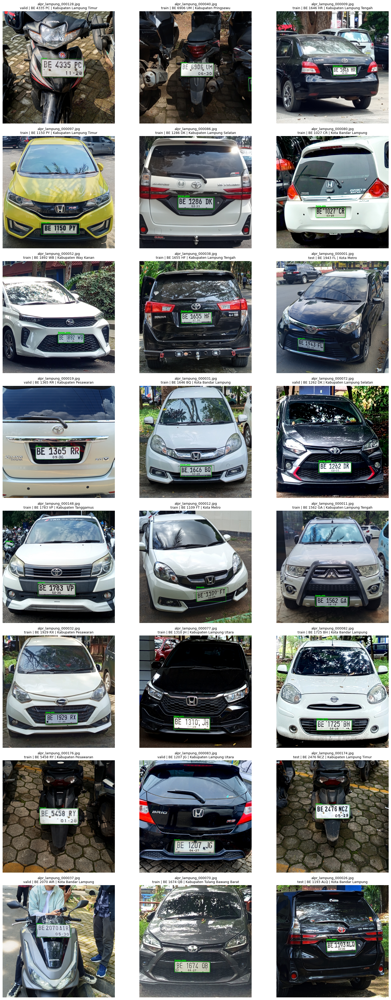

In [ ]:
def read_yolo_bboxes(label_path: Path):
    boxes = []
    if not label_path.exists():
        return boxes

    for line in label_path.read_text().splitlines():
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        try:
            class_id = parse_class_id(parts[0])
            x_center, y_center, width, height = [float(v) for v in parts[1:]]
        except Exception:
            continue
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes


def draw_yolo_bboxes(image_path: Path, label_path: Path):
    image_bgr = cv2.imread(str(image_path))
    if image_bgr is None:
        raise ValueError(f'Gagal membaca image: {image_path}')

    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img_h, img_w = image_rgb.shape[:2]

    for class_id, x_center, y_center, width, height in read_yolo_bboxes(label_path):
        x1 = int((x_center - width / 2) * img_w)
        y1 = int((y_center - height / 2) * img_h)
        x2 = int((x_center + width / 2) * img_w)
        y2 = int((y_center + height / 2) * img_h)

        x1 = max(0, min(img_w - 1, x1))
        y1 = max(0, min(img_h - 1, y1))
        x2 = max(0, min(img_w - 1, x2))
        y2 = max(0, min(img_h - 1, y2))

        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 220, 0), 2)
        label_text = CLASS_NAMES[class_id] if 0 <= class_id < len(CLASS_NAMES) else str(class_id)
        cv2.putText(
            image_rgb,
            label_text,
            (x1, max(15, y1 - 6)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            (0, 220, 0),
            2,
            cv2.LINE_AA,
        )

    return image_rgb


final_image_rows = []
for split in SPLITS:
    for image_path in list_files_by_ext(OUTPUT_ROOT / split / 'images', IMAGE_EXTS):
        final_image_rows.append({'split': split, 'image_path': image_path, 'filename': image_path.name})

if len(final_image_rows) == 0:
    print('Tidak ada gambar final untuk divisualisasikan.')
else:
    sample_count = min(max(15, min(N_VISUALIZE, 30)), len(final_image_rows))
    sampled_rows = random.sample(final_image_rows, sample_count)
    gt_lookup = ground_truth_with_split_df.set_index('filename', drop=False)

    cols = 3
    rows = math.ceil(sample_count / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5.5 * cols, 4.8 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, sample in zip(axes, sampled_rows):
        split = sample['split']
        image_path = sample['image_path']
        label_path = OUTPUT_ROOT / split / 'labels' / f'{image_path.stem}.txt'
        drawn = draw_yolo_bboxes(image_path, label_path)

        gt_row = gt_lookup.loc[image_path.name] if image_path.name in gt_lookup.index else None
        if gt_row is not None:
            title = f"{image_path.name}\n{split} | {gt_row['plat_gt']} | {gt_row['wilayah_gt']}"
        else:
            title = f'{image_path.name}\n{split} | ground truth tidak ditemukan'

        ax.imshow(drawn)
        ax.set_title(title, fontsize=9)
        ax.axis('off')

    for ax in axes[len(sampled_rows):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

## 19. Ringkasan Akhir

Bagian terakhir merangkum lokasi file penting, jumlah data per split, dan status kesiapan dataset secara format. Dataset dinyatakan siap secara struktur jika tidak ada error mapping, tidak ada issue label final, dan file `data.yaml` valid.

Keputusan akhir tetap perlu mempertimbangkan visualisasi bbox. Jika bbox banyak yang tidak mengelilingi plat, perbaiki label sebelum training YOLOv8.

In [ ]:
yaml_ok = (
    loaded_yaml.get('train') == 'train/images' and
    loaded_yaml.get('val') == 'valid/images' and
    loaded_yaml.get('test') == 'test/images' and
    loaded_yaml.get('nc') == 1 and
    loaded_yaml.get('names') == CLASS_NAMES
)

mapping_has_blocker = int(mapping_df['status'].isin(['error', 'missing']).sum()) > 0
final_validation_has_issue = bool(
    (validation_df['missing_label_files'].sum() > 0) or
    (validation_df['orphan_label_files'].sum() > 0) or
    (validation_df['invalid_label_files'].sum() > 0)
)
copy_has_error = bool((copy_df['status'] != 'copied').any())
ready_for_training = yaml_ok and (not mapping_has_blocker) and (not final_validation_has_issue) and (not copy_has_error)

print('Lokasi dataset final              :', OUTPUT_ROOT)
print('Lokasi data.yaml final            :', data_yaml_path)
print('Lokasi ground_truth_with_split.csv:', ground_truth_with_split_path)
print('Lokasi filename_mapping.csv       :', filename_mapping_path)
print('Lokasi split_report.csv           :', split_report_path)
print()
print('Jumlah data per split:')
display(split_report_df)
print()
print('Mapping error       :', int(mapping_df['status'].eq('error').sum()))
print('Mapping missing     :', int(mapping_df['status'].eq('missing').sum()))
print('Mapping extra       :', int(mapping_df['status'].eq('extra').sum()))
print('Issue label final   :', int(validation_df['invalid_label_files'].sum()))
print('data.yaml valid     :', yaml_ok)
print()

if ready_for_training:
    print('Kesimpulan: dataset final siap secara struktur dan format untuk training YOLOv8 detection.')
    print('Lanjutkan training hanya jika visualisasi bbox sudah terlihat benar mengelilingi plat nomor.')
else:
    print('Kesimpulan: dataset final belum sepenuhnya bersih. Periksa filename_mapping.csv, split_report.csv, dan issue label sebelum training.')

Lokasi dataset final              : /content/drive/MyDrive/ALPR-Lampung-final
Lokasi data.yaml final            : /content/drive/MyDrive/ALPR-Lampung-final/data.yaml
Lokasi ground_truth_with_split.csv: /content/drive/MyDrive/ALPR-Lampung-final/ground_truth_with_split.csv
Lokasi filename_mapping.csv       : /content/drive/MyDrive/ALPR-Lampung-final/filename_mapping.csv
Lokasi split_report.csv           : /content/drive/MyDrive/ALPR-Lampung-final/split_report.csv

Jumlah data per split:


,split,num_images,num_labels,num_ground_truth,notes
0,train,137,137,137,OK
1,valid,36,36,36,OK
2,test,12,12,12,OK



Mapping error       : 0
Mapping missing     : 0
Mapping extra       : 0
Issue label final   : 0
data.yaml valid     : True

Kesimpulan: dataset final siap secara struktur dan format untuk training YOLOv8 detection.
Lanjutkan training hanya jika visualisasi bbox sudah terlihat benar mengelilingi plat nomor.
